In [1]:
import matplotlib.pyplot as plt
import numpy as np
import random as rd
import scipy.ndimage as ndimage
from matplotlib import cm
# from numba import jit, cuda 
from skimage.util import random_noise
import sys

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D , Flatten,Conv1D, MaxPooling1D,Input, add, Conv3D,MaxPooling3D
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
from tensorflow import keras


import tensorflow as tf


from scipy.ndimage import gaussian_filter
from tqdm import tqdm
import random
import time as tm

2022-09-06 17:27:31.981673: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-09-06 17:27:31.981695: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
import matplotlib 
# if you use night mode on your notebook
if 1:
    font = {'family' : 'normal','weight' : 'normal', 'size'   : 32}
    matplotlib.rc('font', **font)

In [3]:
def maxelements(seq):
    ''' Return list of position(s) of largest element '''
    max_indices = []
    if seq:
        max_val = seq[0]
        for i,val in ((i,val) for i,val in enumerate(seq) if val >= max_val):
            if val == max_val:
                max_indices.append(i)
            else:
                max_val = val
                max_indices = [i]

    return max_indices


def locate_occ(liste_occ):

    m = max(liste_occ)
    m2 = np.round(max(liste_occ_r),4)
    print("Maximum of ", m2*100," % ")
    if m2<0.50:
        print("NO OCCULTATION DETECTED")
        plt.figure(figsize=(20,10))
        plt.plot(liste_occ_r,linewidth=10)
        plt.grid("on")
        plt.ylim(-0.05,1.05)
        plt.xlabel("time")
        plt.ylabel("Probability of Occ")
        plt.title("Negative occultation")
    else:
        [i for i, j in enumerate(liste_occ) if j == m]
        debut = 0
        fin = -1
        position_occ =debut + liste_occ[debut:-1].index(np.max(liste_occ[debut:fin]))

        
        if 0.20 * len(liste_occ) <= liste_occ_r.count(1):
            print(" ############# B A D    D A T A ###############")
            print("The observation present an absurd amount of positive detection")
            print(" #  Max achieved on ",
                  len(maxelements(liste_occ_r))," points out of ", len(liste_occ)," #")
        else:
            print("Detection on frames # :" , maxelements(liste_occ))
            for k in range(0,len(maxelements(liste_occ))) :
                position_occ = maxelements(liste_occ)[k]

                input_data_occ = Data[0][position_occ]
                input_data_ref = Data[1][position_occ]
                for j in range(position_occ,position_occ+19,1):
                    input_data_occ = np.concatenate((input_data_occ,Data[0][j]))
                    input_data_ref = np.concatenate((input_data_ref,Data[1][j]))
                
                absolute_max_occ=np.max(Data[0])
                absolute_max_ref=np.max(Data[1])
                
                input_data_occ = input_data_occ/np.max(input_data_occ) #absolute_max_occ
                input_data_ref = input_data_ref/np.max(input_data_ref) #absolute_max_ref
                plt.figure(figsize=(20, 6))
                plt.suptitle(str(position_occ)+" /" + str(len(Data[0]))+'    '+str(liste_occ[position_occ]) )
                plt.subplot(3,1,1)
                plt.imshow(input_data_occ.T, vmin=0, vmax=1)

                plt.subplot(3,1,2)
                plt.imshow(input_data_ref.T,  vmin=0, vmax=1)

                plt.subplot(3,1,3)
                plt.plot(liste_occ,'r-')
                plt.plot(position_occ,liste_occ[position_occ] ,marker=".", markersize=10)
                plt.plot(position_occ+20,liste_occ[position_occ+20] ,color = "g",marker="*", markersize=5)
                plt.show()

                print('\n'*3)
        return 



def treatment(liste):
    final_list = []
    for i in range(0,len(liste)):
        if liste[i][1]-liste[i][0]>10:
            final_list.append(liste[i])          
    return final_list



# Launch ODNet Here
### You can chose the observation an see the results ! Use (569) Misa for an example of POSITIVE detection and (2476) Andersen for a NEGATIVE observation.

2022-09-06 17:27:33.429405: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-09-06 17:27:33.429428: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2022-09-06 17:27:33.429442: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (pop-os): /proc/driver/nvidia/version does not exist
2022-09-06 17:27:33.429599: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
100%|███████████████████████████████████████| 1943/1943 [01:17<00:00, 25.04it/s]


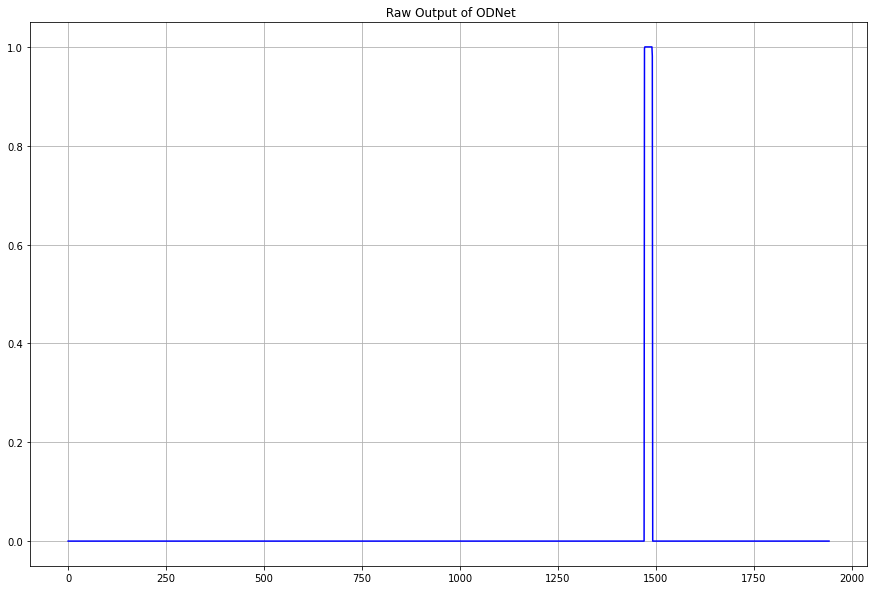

In [4]:
# directory to model
model_2=keras.models.load_model('ODNet_trained')

#directory to data
dir_data = "Observations/"
Data = np.load(dir_data+"20210627_occultation_Misa.npy")
#Data = np.load(dir_data+"20220607_occultation_Andersen.npy")

# some lists
liste_occ = []
liste_occ_r = []

trust_value = 0.90 #threshold for considering a returned float is a detection
sbs = 1 #the "jump" of the scan. "1" means every frame one by one 

# one way 
absolute_max_occ = np.max(Data[0])
absolute_max_ref = np.max(Data[1])

liste_flux = []
saut = 1 #pour les longues occultations. au lieu de faire 20 consecutives, ça fait 2 en 2 dans le 20 
for i in tqdm(range(0,len(Data[0])-21*saut,sbs)):

    
    input_data = np.zeros((2,20,32,32))
    
    input_data_occ=np.zeros((20,32,32))
    input_data_ref=np.zeros((20,32,32))
    
    input_data_occ = Data[0][i:i+20]
    input_data_ref = Data[1][i:i+20]

    input_data[0] = input_data_occ / absolute_max_occ#np.max(Data[0])
    input_data[1] = input_data_ref /absolute_max_ref# np.max(Data[1])
    
    y_p=model_2.predict( input_data.reshape(1,2,20,32,32) ) # actual prediction
    
    liste_occ.append(float(y_p))
    liste_flux.append(np.sum(input_data[0]))

    #rounding
    if y_p >= trust_value:
        y_p_r = 1
    else:
        y_p_r = 0
    liste_occ_r.append(float(y_p_r))

    
plt.figure(figsize = (15,10))
plt.title(" Raw Output of ODNet")
plt.plot(liste_occ,'b')
plt.grid()




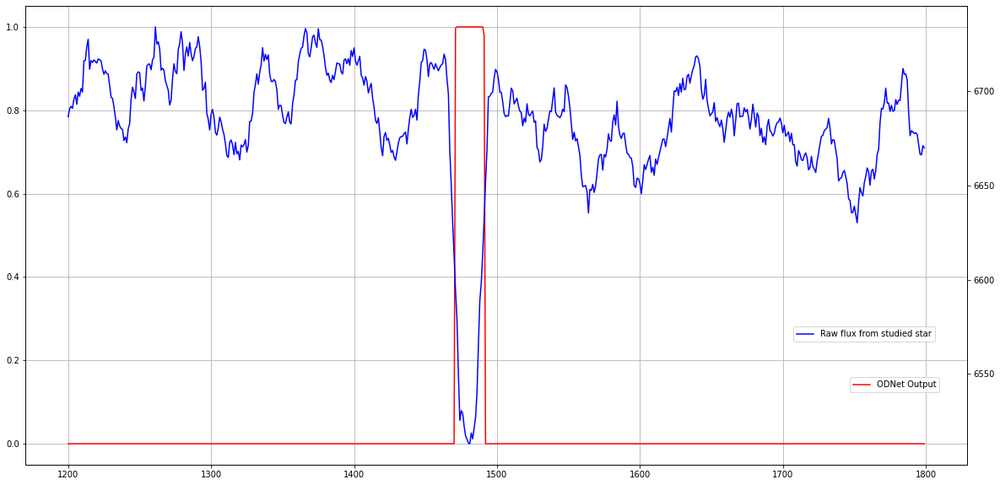

In [5]:
fig, ax1 = plt.subplots(figsize=(20,10))
ax2 = ax1.twinx()

curve1 = ax1.plot(np.arange(1200,1800),liste_occ[1200:1800],label = "ODNet Output",color='r')
curve2 = ax2.plot(np.arange(1200,1800),liste_flux[1200:1800],label = "Raw flux from studied star",color='b')


ax1.legend(loc = 0, bbox_to_anchor=(0.65, .2, 0.325, 0))
ax2.legend(loc = 0, bbox_to_anchor=(0.47, .2, 0.5, 0.11))
ax1.grid('on')


# Close look at the occultation detection
#### if there is one

Maximum of  100.0  % 
Detection on frames # : [1471, 1472, 1473, 1474, 1475, 1476, 1477, 1478, 1479, 1480, 1481, 1482, 1483, 1484, 1485, 1486, 1487, 1488, 1489, 1490, 1491]


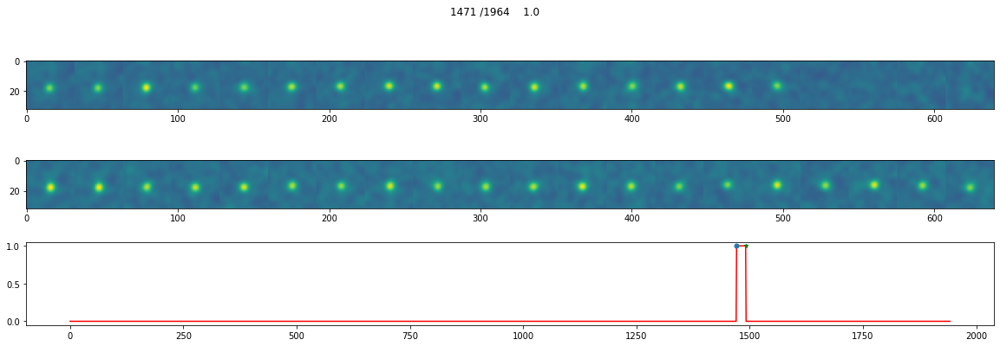

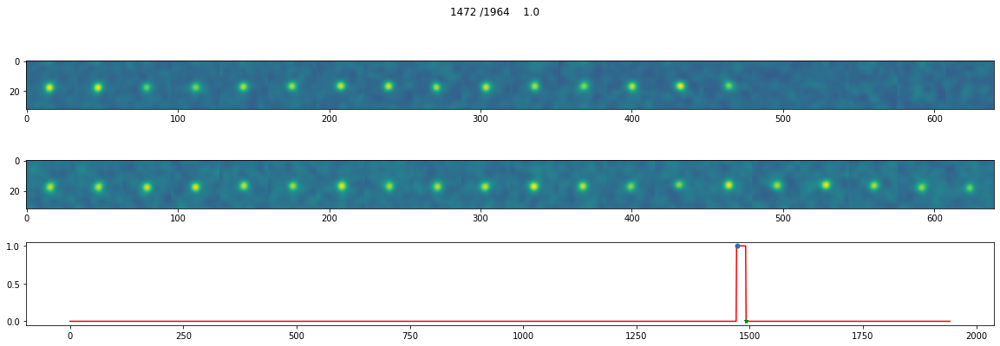

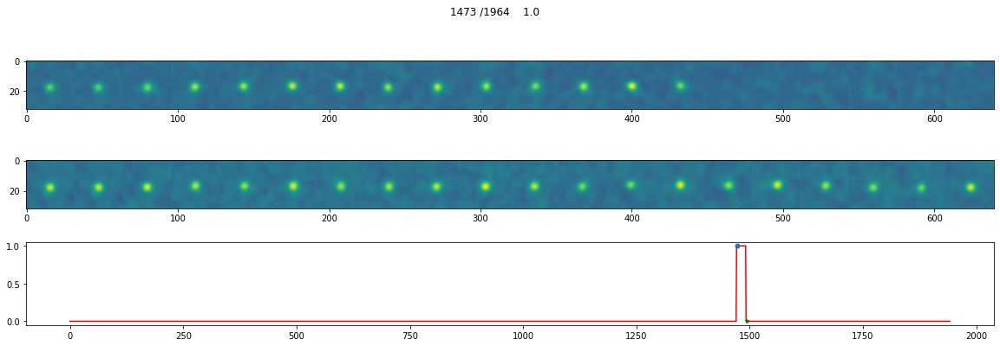

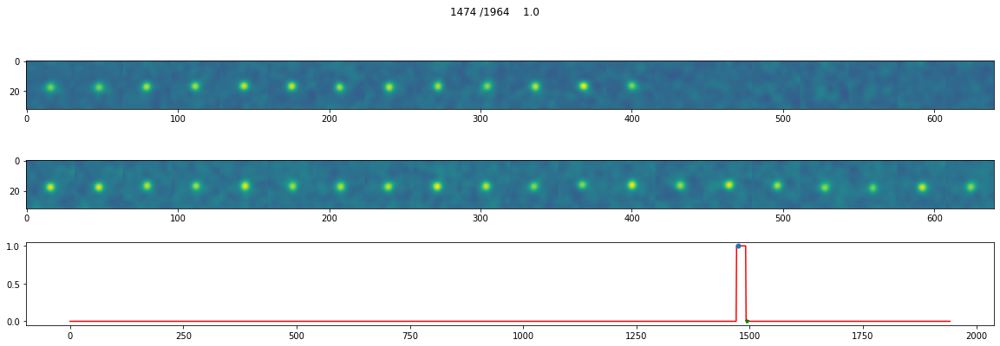

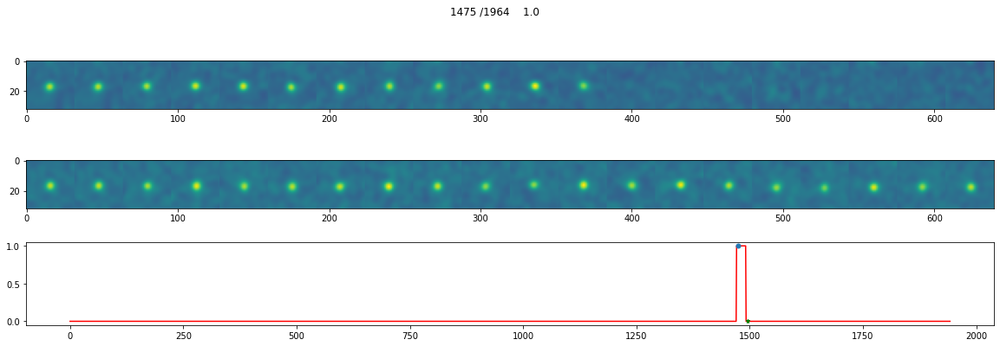

...

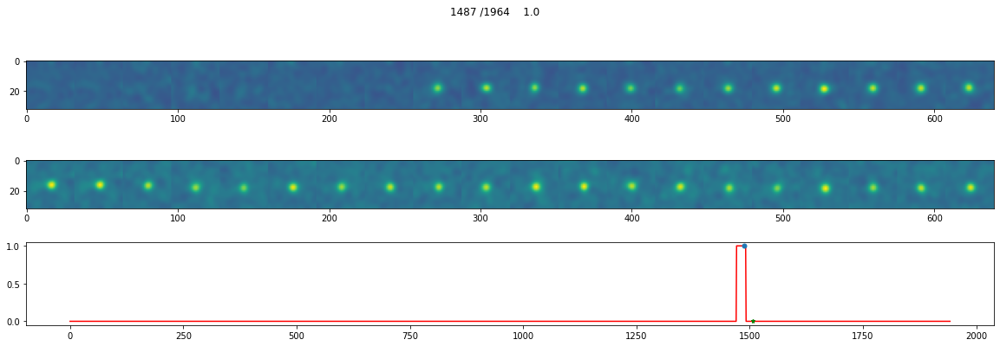

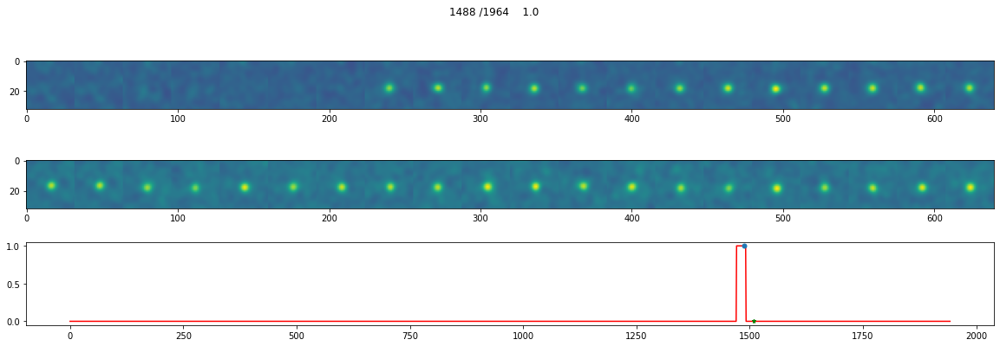

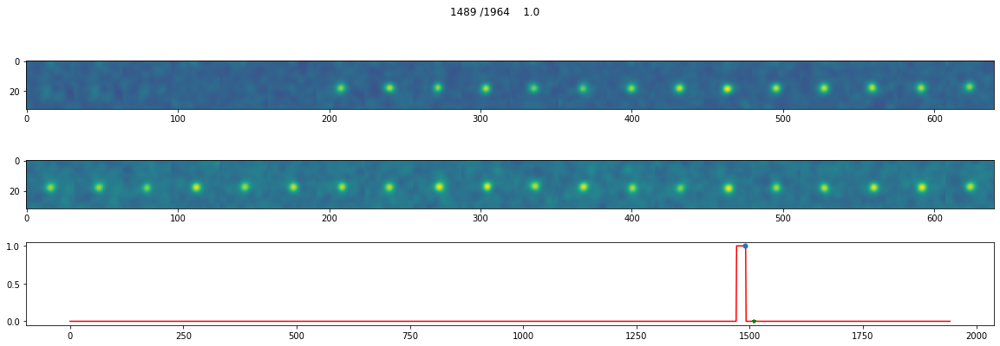

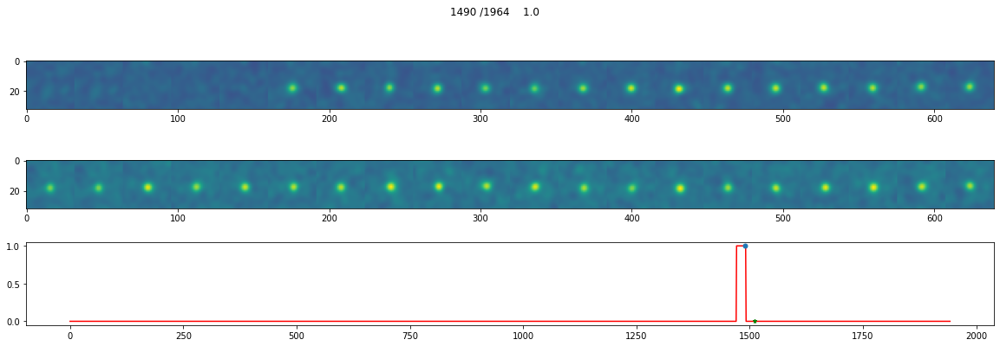

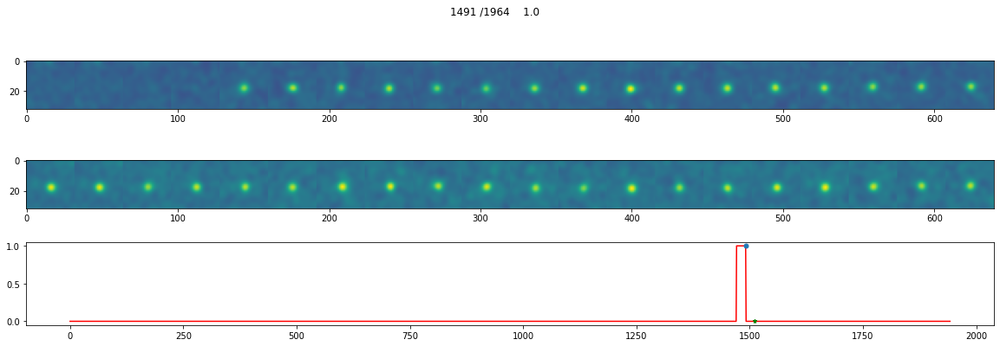

In [6]:
locate_occ(liste_occ_r)

## VISUALIZE DATA

#### Visualise every frame of the given observation. 

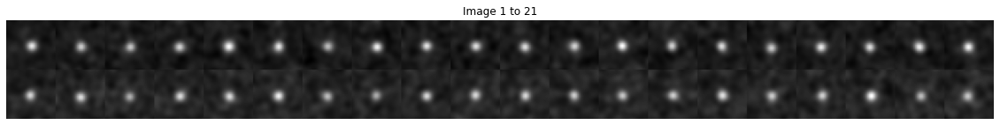

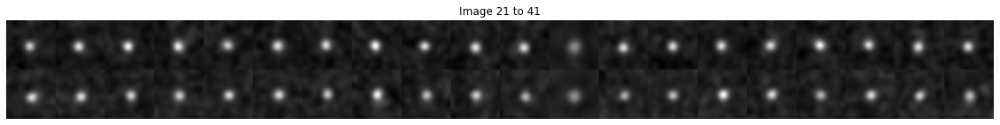

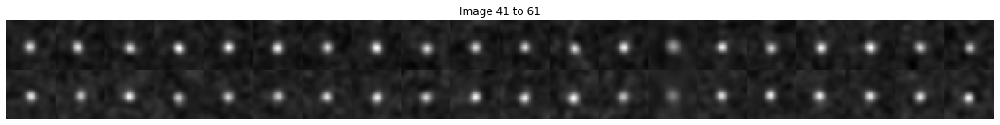

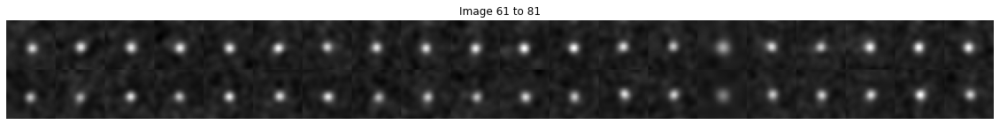

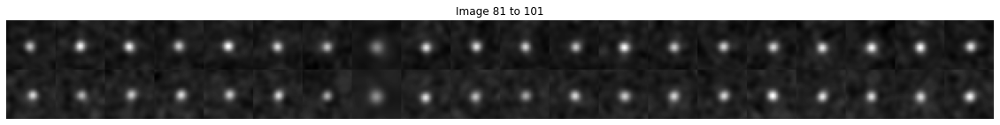

...

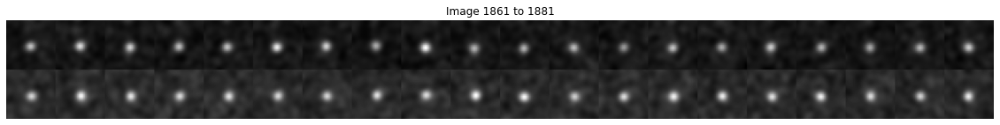

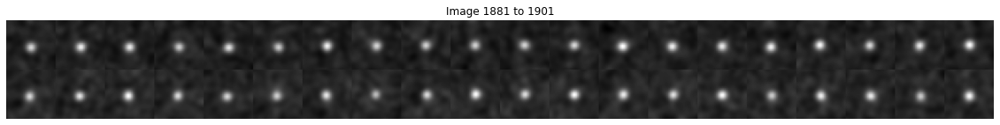

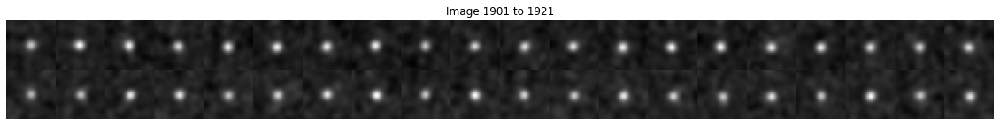

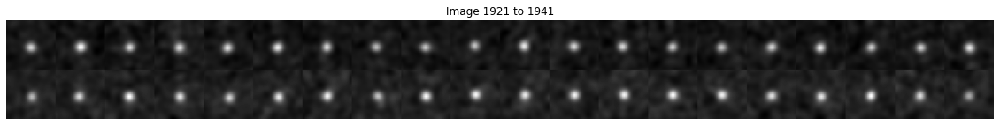

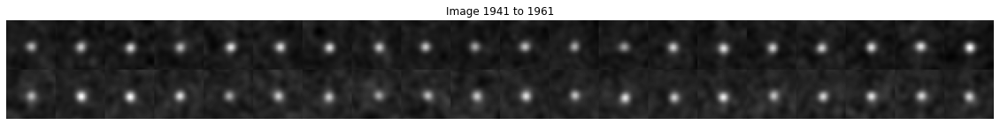

In [7]:
mod = 20
for m in range(1,len(Data[0])-len(Data[0])%mod,mod):
    for k in range(0,20):
        image0=np.zeros((32,32))
        image1=np.zeros((32,32))        
        for i in range(0,32):
            for j in range(0,32):
                image0[i][j] = Data[0][k+m][i][j]
                image1[i][j] = Data[1][k+m][i][j]
        if k == 0:
            fi0 = image0
            fi1 = image1
        else:
            fi0=np.concatenate((fi0,image0))
            fi1=np.concatenate((fi1,image1))
    fi0=fi0/np.max(fi0)
    fi1=fi1/np.max(fi1)
    final_image_RAW = np.concatenate((fi0,fi1),-1)
    
    plt.figure(figsize=(20,5))
    plt.title("Image " + str(m)+ " to "+str(m+20))
    plt.axis('off')
    plt.imshow(final_image_RAW.T,cmap='gray')
    plt.show()   


## PHOTOMETRY
### Visualise the flux of the targeted star along time

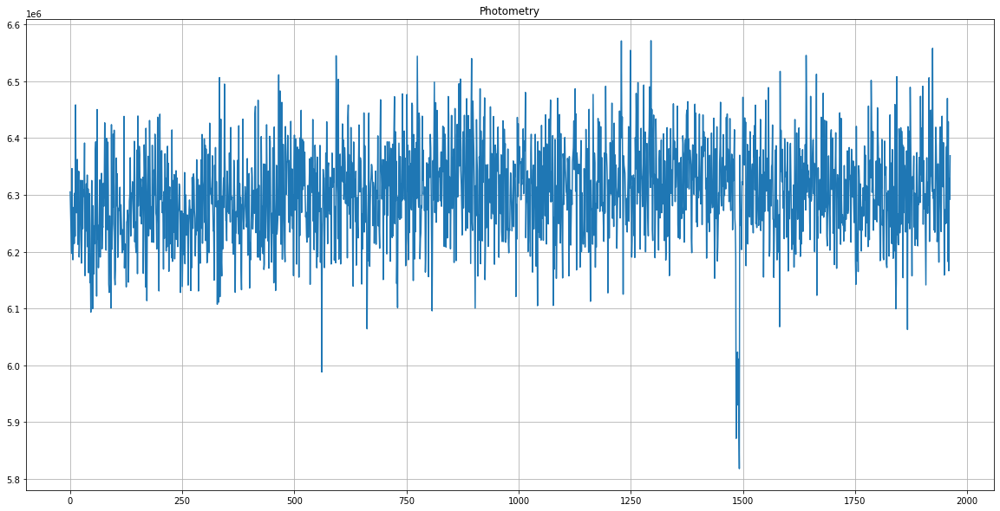

In [10]:
mod = 20
photo = []
for m in range(1,len(Data[0]),1):
    photo.append(np.sum(Data[0][m]))

plt.figure(figsize=(20,10))
plt.title("Photometry")
plt.plot(photo)
plt.grid("on")